In [272]:
!pip install ydata_profiling
from ydata_profiling import ProfileReport
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#Первичный осмотр датафрейма

In [291]:
df = pd.read_csv('/content/kicksharing.csv')

In [274]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 20/20 [00:22<00:00,  1.15s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Выводы
В датафрейме много пропусков, есть выбросы в колонках ```loyalty_accrual_bns_amt, loyalty_accrual_rub_amt, nominal_price_rub_amt, distance_km```. Корреляционный анализ показал ожидаемый результат: общая цена высоко сколлерирована с дистанцией поездки и размером выплаченного кешбека в рублях. В то же время размер выплаченного кешбека в бонусах сколлерирован с кешбеком в рублях.


#Предобработка данных

Обработка пропусков.

In [292]:
df['gender_cd'] = df['gender_cd'].fillna('Неизвестно')
df['education_level_cd'] = df['education_level_cd'].fillna('Неизвестно')
df['marital_status_cd'] = df['marital_status_cd'].fillna('Неизвестно')
df['lvn_state_nm'] = df['lvn_state_nm'].fillna('Неизвестно')
df['loyalty_accrual_rub_amt'] = df['loyalty_accrual_rub_amt'].fillna(0)
df['loyalty_accrual_bns_amt'] = df['loyalty_accrual_bns_amt'].fillna(0)


# df = df[df['distance_km'] <= df['distance_km'].quantile(0.99)]
# df = df[df['loyalty_accrual_bns_amt'] <= df['loyalty_accrual_bns_amt'].quantile(0.99)]
# df = df[df['loyalty_accrual_rub_amt'] <= df['loyalty_accrual_rub_amt'].quantile(0.99)]
# df = df[df['nominal_price_rub_amt'] <= df['nominal_price_rub_amt'].quantile(0.99)]

Работа со временем

In [293]:
for col in ['created_dttm', 'book_start_dttm', 'book_end_dttm', 'local_book_start_dttm']:
    df[col] = pd.to_datetime(df[col])
df['ride_duration_min'] = (df['book_end_dttm'] - df['book_start_dttm']).dt.total_seconds() / 60

col = 'book_start_dttm'
df["start_month"] = df["book_start_dttm"].dt.to_period("M")
df['start_hour'] = df[col].dt.hour
df['start_minute'] = df[col].dt.minute
df['start_day_of_week'] = df[col].dt.dayofweek

Добавление новых, потенциально полезных столбцов

In [294]:
df["profit"] = df["nominal_price_rub_amt"] + df["activation_cost"] - df["loyalty_accrual_rub_amt"]
df['gender_cd'] = df['gender_cd'].map({'M': 'Мужчина', 'F': 'Женщина'})
df['speed_kmh'] = np.where(
    df['ride_duration_min'] > 0,
    df['distance_km'] / (df['ride_duration_min'] / 60),
    None
)
df["speed_kmh"] = pd.to_numeric(df["speed_kmh"], errors="coerce")


df["first_trip_date"] = df.groupby("party_rk")["book_start_dttm"].transform("min")
df["days_from_first"] = (df["book_start_dttm"] - df["first_trip_date"]).dt.days
df["cohort"] = df["first_trip_date"].dt.to_period("M")

Улучшение интерпретации

In [295]:
def create_age_groups(age):
    if age < 18:
        return 'До 18'
    elif 18 <= age < 25:
        return '18-24'
    elif 25 <= age < 35:
        return '25-34'
    elif 35 <= age < 45:
        return '35-44'
    elif 45 <= age < 55:
        return '45-54'
    elif 55 <= age < 65:
        return '55-64'
    else:
        return '65+'

def simplify_marital_status(status):
    if status in ['MAR', 'OMR']:
        return 'В браке'
    elif status in ['DIV', 'DLW']:
        return 'Разведен/а'
    elif status in ['UNM', 'FAL']:
        return 'Не в браке'
    elif status in ['WID']:
        return 'Вдовец/вдова'
    elif status in ['CIV', 'IMR']:
        return 'Гражданский брак'
    else:
        return 'Другое'


df['age_group'] = df['age'].apply(create_age_groups)
df['marital_status_cd'] = df['marital_status_cd'].apply(simplify_marital_status)

df['education_level_cd'] = df['education_level_cd'].map({
    'SCH': 'Среднее',
    'GRD': 'Высшее',
    'UGR': 'Неполное высшее',
    'PGR': 'Два высших',
    'ACD': 'Ученая степень',
    'Неизвестно': 'Неизвестно'
})

In [296]:
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 14

# География

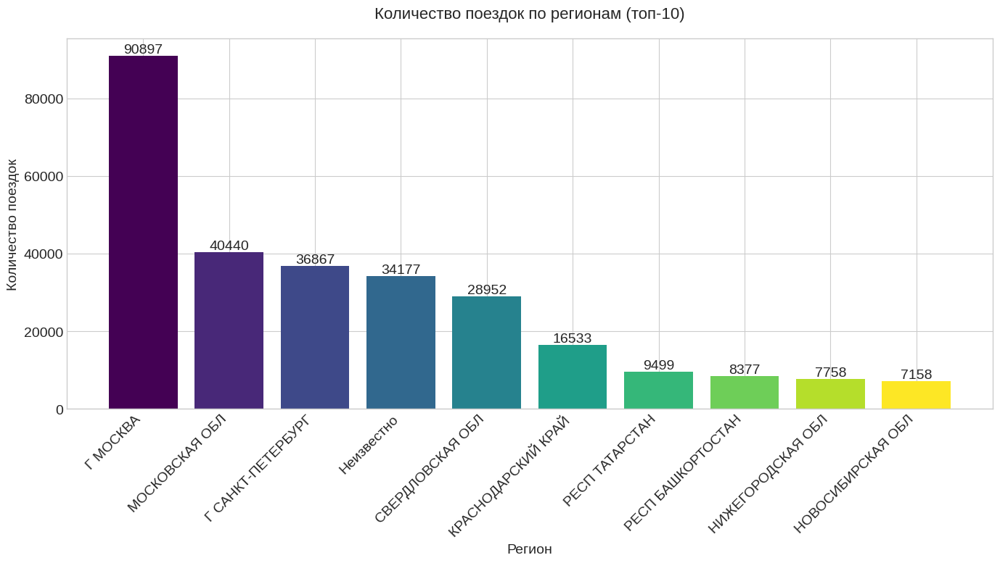

In [297]:
plt.figure()
region_counts = df['lvn_state_nm'].value_counts().head(10)
bars = plt.bar(region_counts.index, region_counts.values,
               color=plt.cm.viridis(np.linspace(0, 1, len(region_counts))))

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 5,
             f'{int(height)}', ha='center', va='bottom')

plt.title('Количество поездок по регионам (топ-10)', fontsize=16, pad=20)
plt.xlabel('Регион')
plt.ylabel('Количество поездок')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

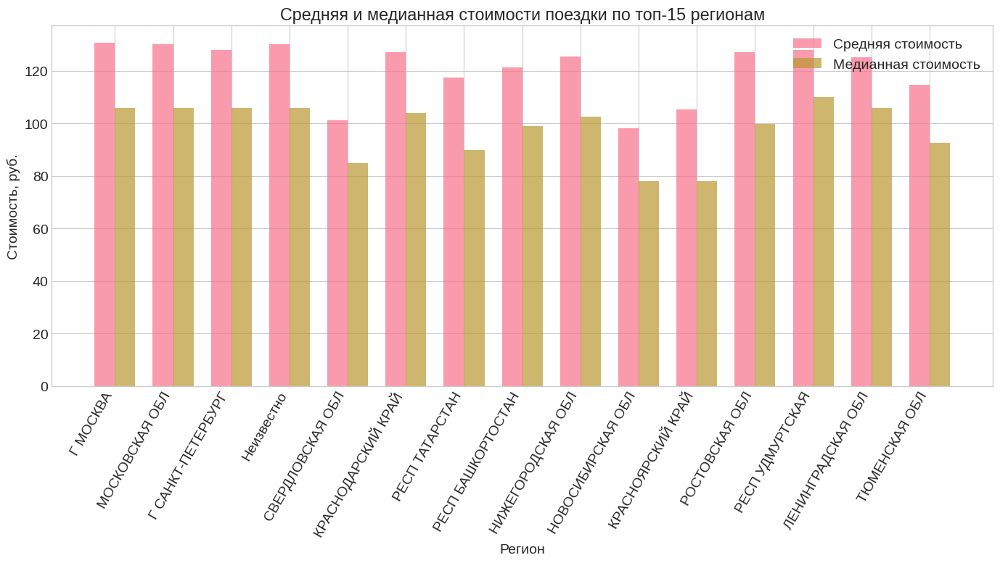

In [298]:
comparison = pd.DataFrame({
    'mean_cost': df.groupby('lvn_state_nm')['nominal_price_rub_amt'].mean(),
    'median_cost': df.groupby('lvn_state_nm')['nominal_price_rub_amt'].median()
})
top_regions = df['lvn_state_nm'].value_counts().head(15).index
comparison_top = comparison.loc[top_regions]

x = np.arange(len(top_regions))
width = 0.35
fig, ax = plt.subplots()
bars1 = ax.bar(x - width/2, comparison_top['mean_cost'], width, label='Средняя стоимость', alpha=0.7)
bars2 = ax.bar(x + width/2, comparison_top['median_cost'], width, label='Медианная стоимость', alpha=0.7)

ax.set_xlabel('Регион')
ax.set_ylabel('Стоимость, руб.')
ax.set_title('Средняя и медианная стоимости поездки по топ-15 регионам')
ax.set_xticks(x)
ax.set_xticklabels(top_regions, rotation=60, ha='right')
ax.legend()

plt.tight_layout()

/tmp/ipython-input-4201021338.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_top_regions, x='lvn_state_nm', y='distance_km',


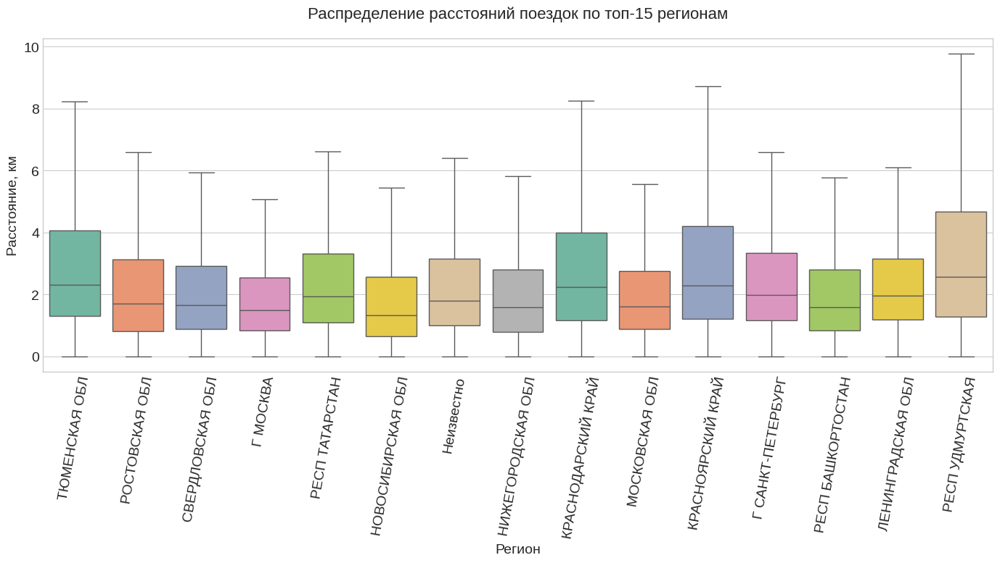

In [299]:
top_regions = df['lvn_state_nm'].value_counts().head(15).index.tolist()
df_top_regions = df[df['lvn_state_nm'].isin(top_regions)]

plt.figure()
sns.boxplot(data=df_top_regions, x='lvn_state_nm', y='distance_km',
            palette='Set2', showfliers=False)
plt.title('Распределение расстояний поездок по топ-15 регионам', fontsize=16, pad=20)
plt.xlabel('Регион')
plt.ylabel('Расстояние, км')
plt.xticks(rotation=80)
plt.tight_layout()

## Вывод
Основная масса пользователей - это жители крупных городов и регионов с развитой инфраструктурой. Важно отметить то, что и средняя и медианная стомости поездки примерно одинаковы для всех регионов. То же самое справедливо и для расстояния поездки.

# Демография


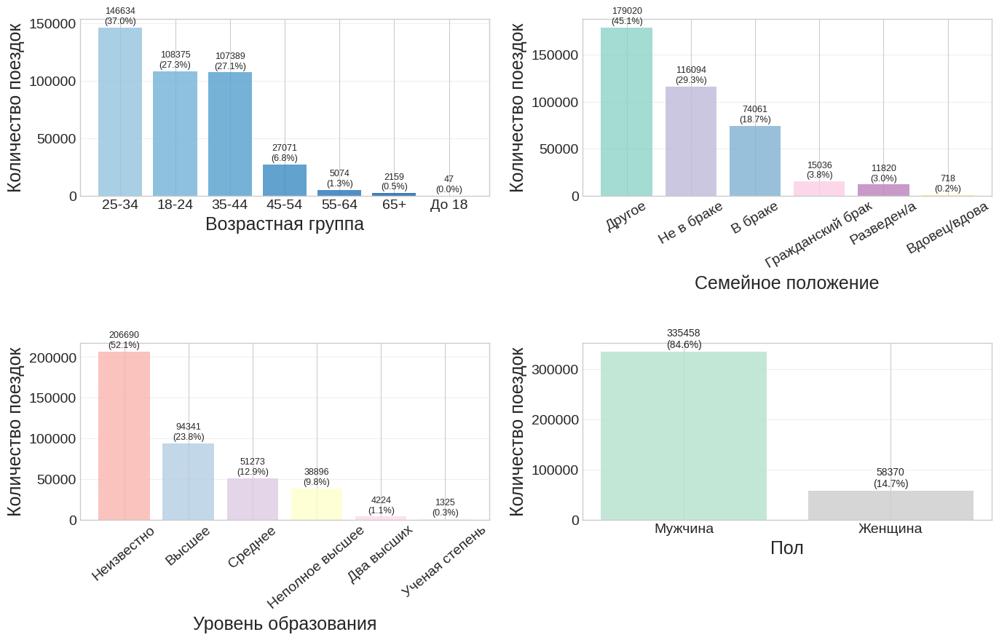

In [300]:
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
age_group_counts = df['age_group'].value_counts()
colors = plt.cm.Blues(np.linspace(0.4, 0.9, len(age_group_counts)))
bars1 = axes[0, 0].bar(age_group_counts.index, age_group_counts.values, color=colors, alpha=0.8)

for bar in bars1:
    height = bar.get_height()
    percentage = (height / len(df)) * 100
    axes[0, 0].text(bar.get_x() + bar.get_width()/2., height + max(age_group_counts.values)*0.01,
                   f'{int(height)}\n({percentage:.1f}%)', ha='center', va='bottom', fontsize=9)

axes[0, 0].set_xlabel('Возрастная группа', fontsize=18)
axes[0, 0].set_ylabel('Количество поездок', fontsize=18)
axes[0, 0].tick_params(axis='x')
axes[0, 0].grid(axis='y', alpha=0.3)

marital_counts = df['marital_status_cd'].value_counts()
colors = plt.cm.Set3(np.linspace(0, 1, len(marital_counts)))
bars2 = axes[0, 1].bar(marital_counts.index, marital_counts.values, color=colors, alpha=0.8)

for bar in bars2:
    height = bar.get_height()
    percentage = (height / len(df)) * 100
    axes[0, 1].text(bar.get_x() + bar.get_width()/2., height + max(marital_counts.values)*0.01,
                   f'{int(height)}\n({percentage:.1f}%)', ha='center', va='bottom', fontsize=9)

axes[0, 1].set_xlabel('Семейное положение', fontsize=18)
axes[0, 1].set_ylabel('Количество поездок', fontsize=18)
axes[0, 1].tick_params(axis='x', rotation=30)
axes[0, 1].grid(axis='y', alpha=0.3)
education_counts = df['education_level_cd'].value_counts()
colors = plt.cm.Pastel1(np.linspace(0, 1, len(education_counts)))
bars3 = axes[1, 0].bar(education_counts.index, education_counts.values, color=colors, alpha=0.8)

for bar in bars3:
    height = bar.get_height()
    percentage = (height / len(df)) * 100
    axes[1, 0].text(bar.get_x() + bar.get_width()/2., height + max(education_counts.values)*0.01,
                   f'{int(height)}\n({percentage:.1f}%)', ha='center', va='bottom', fontsize=9)

axes[1, 0].set_xlabel('Уровень образования', fontsize=18)
axes[1, 0].set_ylabel('Количество поездок', fontsize=18)
axes[1, 0].tick_params(axis='x', rotation=40)
axes[1, 0].grid(axis='y', alpha=0.3)

gender_counts = df['gender_cd'].value_counts()
colors = plt.cm.Pastel2(np.linspace(0, 1, len(gender_counts)))
bars4 = axes[1, 1].bar(gender_counts.index, gender_counts.values, color=colors, alpha=0.8)

for bar in bars4:
    height = bar.get_height()
    percentage = (height / len(df)) * 100
    axes[1, 1].text(bar.get_x() + bar.get_width()/2., height + max(gender_counts.values)*0.01,
                   f'{int(height)}\n({percentage:.1f}%)', ha='center', va='bottom', fontsize=10)

axes[1, 1].set_xlabel('Пол', fontsize=18)
axes[1, 1].set_ylabel('Количество поездок', fontsize=18)
axes[1, 1].grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.subplots_adjust(top=0.93, bottom=0.07)

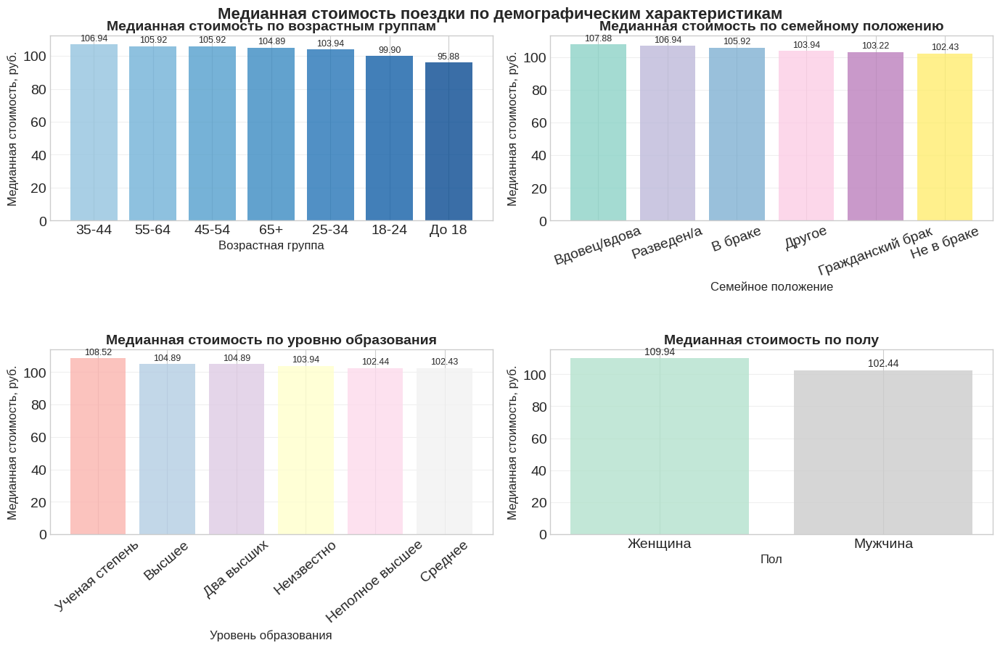

In [301]:
fig, axes = plt.subplots(2, 2)
fig.suptitle('Медианная стоимость поездки по демографическим характеристикам', fontsize=16, fontweight='bold')

age_group_median = df.groupby('age_group')['nominal_price_rub_amt'].median().sort_values(ascending=False)
colors = plt.cm.Blues(np.linspace(0.4, 0.9, len(age_group_median)))
bars1 = axes[0, 0].bar(age_group_median.index, age_group_median.values, color=colors, alpha=0.8)

for bar in bars1:
    height = bar.get_height()
    axes[0, 0].text(bar.get_x() + bar.get_width()/2., height + max(age_group_median.values)*0.01,
                   f'{height:.2f}', ha='center', va='bottom', fontsize=9)

axes[0, 0].set_title('Медианная стоимость по возрастным группам', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Возрастная группа', fontsize=12)
axes[0, 0].set_ylabel('Медианная стоимость, руб.', fontsize=12)
axes[0, 0].tick_params(axis='x')
axes[0, 0].grid(axis='y', alpha=0.3)

marital_median = df.groupby('marital_status_cd')['nominal_price_rub_amt'].median().sort_values(ascending=False)
colors = plt.cm.Set3(np.linspace(0, 1, len(marital_median)))
bars2 = axes[0, 1].bar(marital_median.index, marital_median.values, color=colors, alpha=0.8)

for bar in bars2:
    height = bar.get_height()
    axes[0, 1].text(bar.get_x() + bar.get_width()/2., height + max(marital_median.values)*0.01,
                   f'{height:.2f}', ha='center', va='bottom', fontsize=9)

axes[0, 1].set_title('Медианная стоимость по семейному положению', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Семейное положение', fontsize=12)
axes[0, 1].set_ylabel('Медианная стоимость, руб.', fontsize=12)
axes[0, 1].tick_params(axis='x', rotation=20)
axes[0, 1].grid(axis='y', alpha=0.3)

education_median = df.groupby('education_level_cd')['nominal_price_rub_amt'].median().sort_values(ascending=False)
colors = plt.cm.Pastel1(np.linspace(0, 1, len(education_median)))
bars3 = axes[1, 0].bar(education_median.index, education_median.values, color=colors, alpha=0.8)

for bar in bars3:
    height = bar.get_height()
    axes[1, 0].text(bar.get_x() + bar.get_width()/2., height + max(education_median.values)*0.01,
                   f'{height:.2f}', ha='center', va='bottom', fontsize=9)

axes[1, 0].set_title('Медианная стоимость по уровню образования', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Уровень образования', fontsize=12)
axes[1, 0].set_ylabel('Медианная стоимость, руб.', fontsize=12)
axes[1, 0].tick_params(axis='x', rotation=40)
axes[1, 0].grid(axis='y', alpha=0.3)

gender_median = df.groupby('gender_cd')['nominal_price_rub_amt'].median().sort_values(ascending=False)
colors = plt.cm.Pastel2(np.linspace(0, 1, len(gender_median)))
bars4 = axes[1, 1].bar(gender_median.index, gender_median.values, color=colors, alpha=0.8)

for bar in bars4:
    height = bar.get_height()
    axes[1, 1].text(bar.get_x() + bar.get_width()/2., height + max(gender_median.values)*0.01,
                   f'{height:.2f}', ha='center', va='bottom', fontsize=10)

axes[1, 1].set_title('Медианная стоимость по полу', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Пол', fontsize=12)
axes[1, 1].set_ylabel('Медианная стоимость, руб.', fontsize=12)
axes[1, 1].grid(axis='y', alpha=0.3)


plt.tight_layout()
plt.subplots_adjust(top=0.93, bottom=0.07)

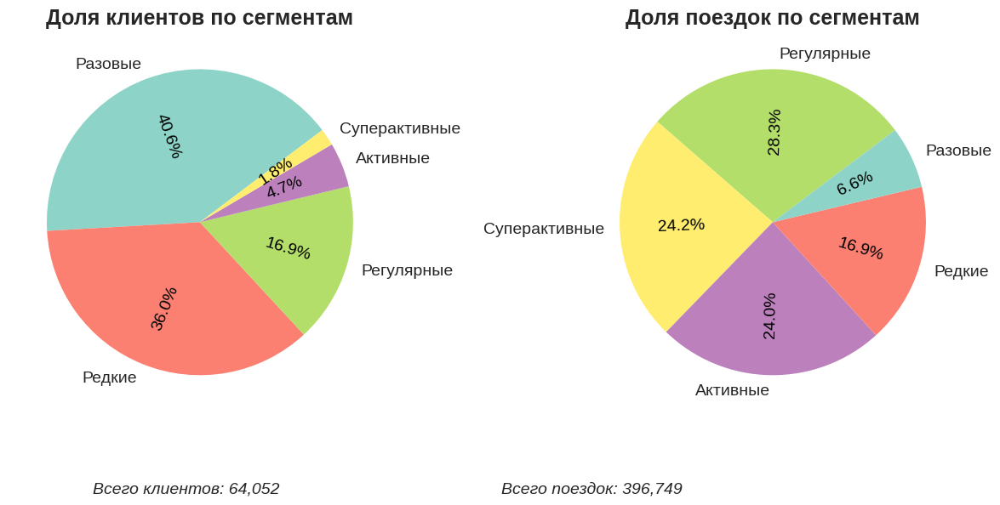

In [302]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
user_trip_counts = df['party_rk'].value_counts().reset_index()
user_trip_counts.columns = ['party_rk', 'ride_count']

def define_user_segment(trip_count):
    if trip_count == 1:
        return 'Разовые'
    elif 2 <= trip_count <= 5:
        return 'Редкие'
    elif 6 <= trip_count <= 20:
        return 'Регулярные'
    elif 21 <= trip_count <= 50:
        return 'Активные'
    else:
        return 'Суперактивные'

user_trip_counts['user_segment'] = user_trip_counts['ride_count'].apply(define_user_segment)
df = df.merge(user_trip_counts[['party_rk', 'user_segment']], on='party_rk')

segments = user_trip_counts['user_segment'].value_counts().index
colors = plt.cm.Set3(np.linspace(0, 1, len(segments)))
color_map = {segment: color for segment, color in zip(segments, colors)}

segment_user_counts = user_trip_counts['user_segment'].value_counts()
segment_trip_counts = df['user_segment'].value_counts()

def rotate_labels(wedges, autotexts):
    for i, a in enumerate(autotexts):
        ang = (wedges[i].theta2 + wedges[i].theta1) / 2.0
        if ang > 90 and ang < 270:
            ang = ang + 180
        a.set_rotation(ang)
        a.set_rotation_mode("anchor")
        a.set_fontsize(14)
        a.set_color("black")

segment_colors1 = [color_map[segment] for segment in segment_user_counts.index]
wedges1, texts1, autotexts1 = ax1.pie(segment_user_counts.values,
                                      labels=segment_user_counts.index,
                                      autopct='%1.1f%%',
                                      colors=segment_colors1,
                                      startangle=37,
                                      textprops={'fontsize': 14})
ax1.set_title('Доля клиентов по сегментам', fontsize=18, fontweight='bold')

rotate_labels(wedges1, autotexts1)
segment_colors2 = [color_map[segment] for segment in segment_trip_counts.index]
wedges2, texts2, autotexts2 = ax2.pie(segment_trip_counts.values,
                                      labels=segment_trip_counts.index,
                                      autopct='%1.1f%%',
                                      colors=segment_colors2,
                                      startangle=37,
                                      textprops={'fontsize': 14})
ax2.set_title('Доля поездок по сегментам', fontsize=18, fontweight='bold')

rotate_labels(wedges2, autotexts2)
fig.text(0.1, 0.02, f'Всего клиентов: {len(user_trip_counts):,}', fontsize=14, style='italic')
fig.text(0.5, 0.02, f'Всего поездок: {len(df):,}', fontsize=14, style='italic')

plt.tight_layout()
plt.subplots_adjust(bottom=0.15)
plt.show()


## Вывод
По демографическим характеристикам можно составить усредненный портрет пользователя: неженатый мужчина от 18 до 45 лет c высшим образованием и уровнями ниже. Также стоит отметить то, что стоимость поездки от данных характеристик практически не зависит. Важным открытием является последняя диаграмма, отражающая доли клиентов и их вклад в общее количество поездок. Удивительно, но всего 4.7% процента активных пользователей совершают почти четверь всех поездок.

# Анализ спроса

Text(0.1, 0.02, 'Период: 07.04.2024 - 21.10.2024')

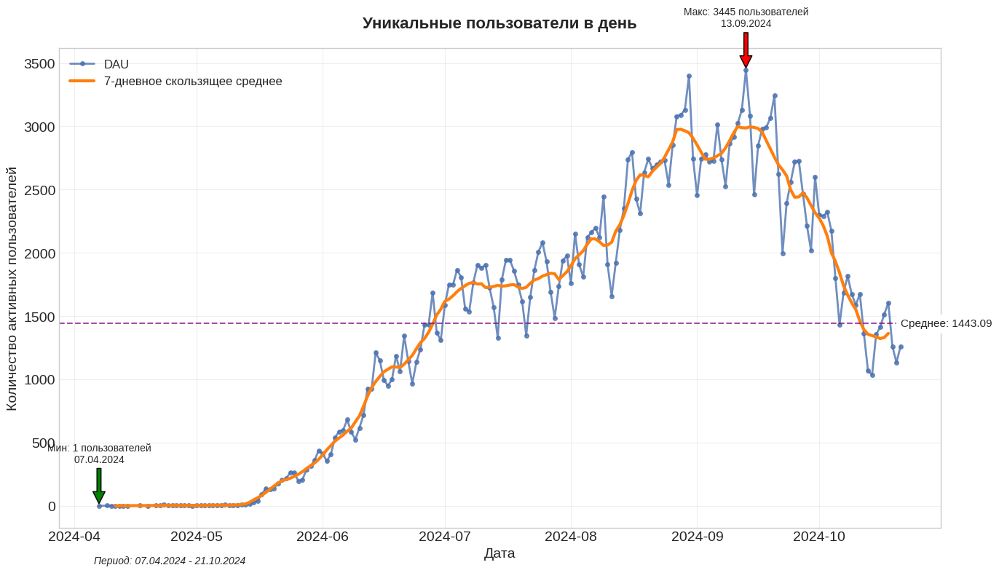

In [303]:
dau = df.groupby(df['book_start_dttm'].dt.date)['party_rk'].nunique().reset_index()
wau = df.groupby(df['book_start_dttm'].dt.strftime('%Y-%U'))['party_rk'].nunique().reset_index()
mau = df.groupby(df['book_start_dttm'].dt.strftime('%Y-%m'))['party_rk'].nunique().reset_index()

plt.figure()
plt.plot(dau['book_start_dttm'], dau['party_rk'],
         marker='o', linewidth=2, markersize=4,
         color='#4C72B0', alpha=0.8, label='DAU')

plt.plot(dau['book_start_dttm'], dau['party_rk'].rolling(window=7, center=True).mean(),
         linewidth=3, color='#FF7F0E',
         label='7-дневное скользящее среднее')

plt.title('Уникальные пользователи в день',
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Дата')
plt.ylabel('Количество активных пользователей')
plt.grid(True, alpha=0.3)
plt.legend(loc='best', fontsize=12)
mean_dau = dau['party_rk'].mean()
max_dau = dau['party_rk'].max()
min_dau = dau['party_rk'].min()
max_dau_date = dau.loc[dau['party_rk'].idxmax(), 'book_start_dttm']
min_dau_date = dau.loc[dau['party_rk'].idxmin(), 'book_start_dttm']
plt.annotate(f'Макс: {max_dau} пользователей\n{max_dau_date.strftime("%d.%m.%Y")}',
             xy=(max_dau_date, max_dau),
             xytext=(max_dau_date, max_dau + max_dau*0.1),
             arrowprops=dict(facecolor='red', shrink=0.05),
             fontsize=10, ha='center')
plt.annotate(f'Мин: {min_dau} пользователей\n{min_dau_date.strftime("%d.%m.%Y")}',
             xy=(min_dau_date, min_dau),
             xytext=(min_dau_date, min_dau + max_dau*0.1),
             arrowprops=dict(facecolor='green', shrink=0.05),
             fontsize=10, ha='center')
plt.axhline(y=mean_dau, color='purple', linestyle='--', alpha=0.7)
plt.text(dau['book_start_dttm'].iloc[-1], mean_dau,
         f'Среднее: {mean_dau:.2f}',
         fontsize=11, va='center', ha='left',
         backgroundcolor='white')
plt.tight_layout()
plt.figtext(0.1, 0.02,
           f'Период: {dau["book_start_dttm"].min().strftime("%d.%m.%Y")} - {dau["book_start_dttm"].max().strftime("%d.%m.%Y")}',
           fontsize=10, style='italic')

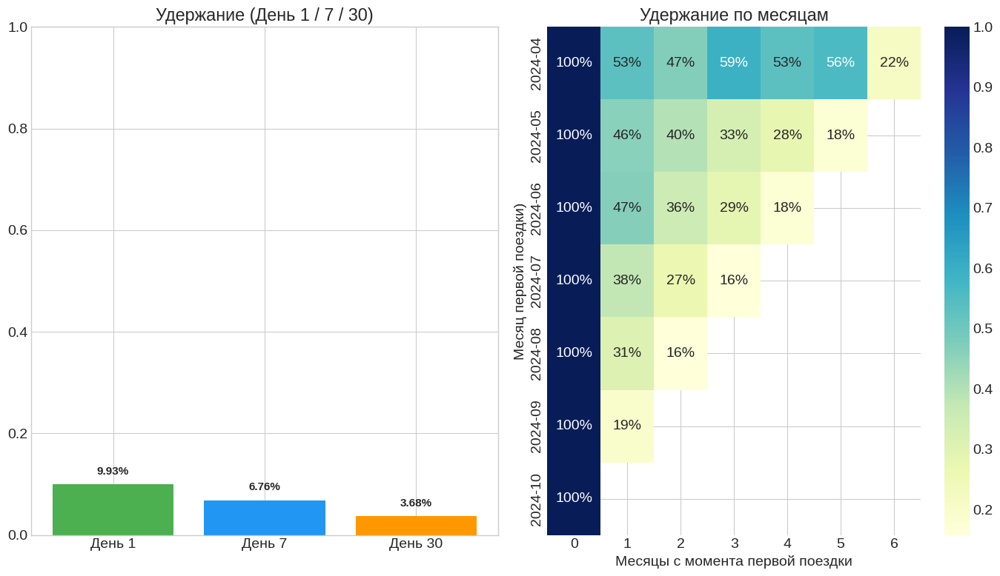

In [304]:
from operator import attrgetter

def retention_rate(df, days):
    users = df.groupby("party_rk")["first_trip_date"].min()
    retained = df[df["days_from_first"].isin(days)]["party_rk"].nunique()
    return retained / users.nunique()

ret_day1 = retention_rate(df, [1])
ret_day7 = retention_rate(df, [7])
ret_day30 = retention_rate(df, [30])
cohort_data = df.groupby(["cohort", "start_month"])["party_rk"].nunique().reset_index()
cohort_data["cohort_index"] = (cohort_data["start_month"] - cohort_data["cohort"]).apply(attrgetter("n"))
cohort_pivot = cohort_data.pivot_table(
    index="cohort",
    columns="cohort_index",
    values="party_rk"
)

cohort_size = cohort_pivot[0]
retention_matrix = cohort_pivot.divide(cohort_size, axis=0)
fig, axes = plt.subplots(1, 2)
axes[0].bar(["День 1", "День 7", "День 30"],
            [ret_day1, ret_day7, ret_day30],
            color=["#4CAF50", "#2196F3", "#FF9800"])
axes[0].set_title("Удержание (День 1 / 7 / 30)")
axes[0].set_ylim(0, 1)
for i, v in enumerate([ret_day1, ret_day7, ret_day30]):
    axes[0].text(i, v + 0.02, f"{v:.2%}", ha="center", fontsize=11, fontweight="bold")
sns.heatmap(retention_matrix, annot=True, fmt=".0%", cmap="YlGnBu", ax=axes[1])
axes[1].set_title("Удержание по месяцам")
axes[1].set_xlabel("Месяцы с момента первой поездки")
axes[1].set_ylabel("Месяц первой поездки)")

plt.tight_layout()

Подавляющее большинство клиентов совершают разовую поездку и больше не возвращаются. Самые живучие когорты — апрельская и майская, а осенние когорты демонстрируют быстрый отток.

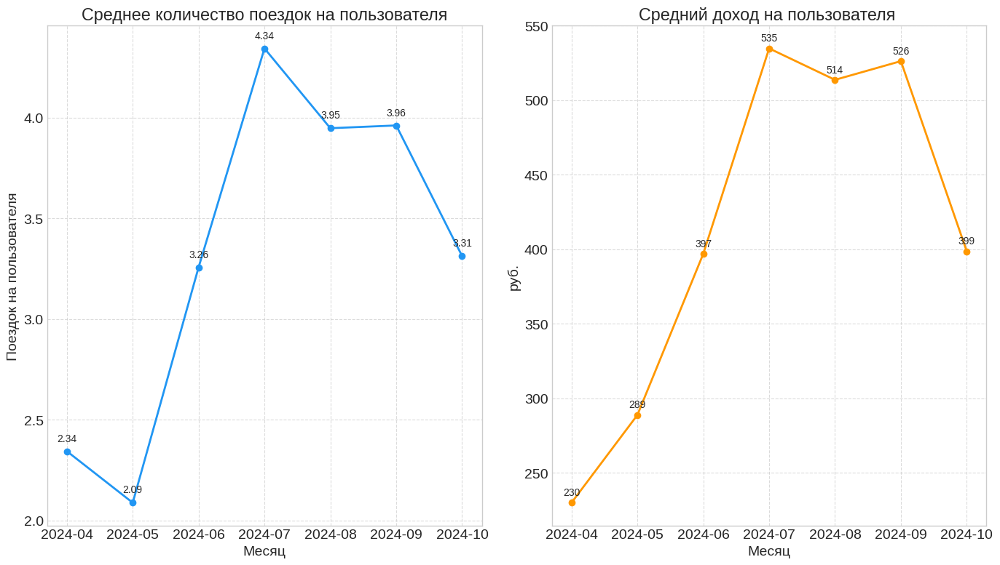

In [305]:
monthly_data = (
    df.groupby(df["book_start_dttm"].dt.to_period("M"))
    .agg(trips=("order_rk", "count"),
         users=("party_rk", "nunique"))
    .reset_index()
)
monthly_data["trips_per_user"] = monthly_data["trips"] / monthly_data["users"]
monthly_revenue = (
    df.groupby(df["book_start_dttm"].dt.to_period("M"))
    .agg(
        revenue=("nominal_price_rub_amt", "sum"),
        users=("party_rk", "nunique")
    )
    .reset_index()
)
monthly_revenue["ARPU"] = monthly_revenue["revenue"] / monthly_revenue["users"]
season_arpu = df["nominal_price_rub_amt"].sum() / df["party_rk"].nunique()

fig, axes = plt.subplots(1, 2)
axes[0].plot(monthly_data["book_start_dttm"].astype(str),
             monthly_data["trips_per_user"], marker="o", linewidth=2, color="#2196F3")
axes[0].set_title("Среднее количество поездок на пользователя")
axes[0].set_xlabel("Месяц")
axes[0].set_ylabel("Поездок на пользователя")
for x, y in zip(monthly_data["book_start_dttm"].astype(str), monthly_data["trips_per_user"]):
    axes[0].text(x, y + 0.05, f"{y:.2f}", ha="center", fontsize=10)
axes[0].grid(True, linestyle="--", alpha=0.7)

axes[1].plot(monthly_revenue["book_start_dttm"].astype(str),
             monthly_revenue["ARPU"], marker="o", linewidth=2, color="#FF9800")
axes[1].set_title("Средний доход на пользователя ")
axes[1].set_xlabel("Месяц")
axes[1].set_ylabel("руб.")
for x, y in zip(monthly_revenue["book_start_dttm"].astype(str), monthly_revenue["ARPU"]):
    axes[1].text(x, y + 5, f"{y:.0f}", ha="center", fontsize=10)
axes[1].grid(True, linestyle="--", alpha=0.7)

plt.tight_layout()

Во всех графиках выше существует закономерность: пиковая активность приходится на летние месяцы.

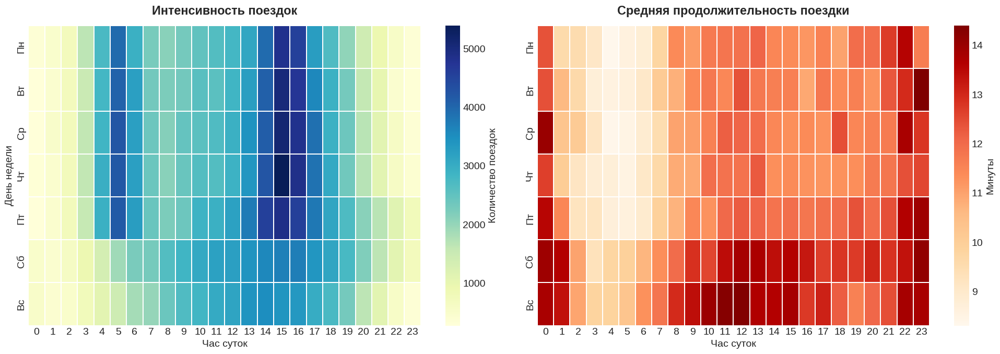

In [306]:
trips_heatmap = (
    df.groupby(["start_day_of_week", "start_hour"])["order_rk"]
    .count()
    .reset_index()
    .pivot(index="start_day_of_week", columns="start_hour", values="order_rk")
)
duration_heatmap = (
    df.groupby(["start_day_of_week", "start_hour"])["ride_duration_min"]
    .mean()
    .reset_index()
    .pivot(index="start_day_of_week", columns="start_hour", values="ride_duration_min")
)

days_map = {0: "Пн", 1: "Вт", 2: "Ср", 3: "Чт", 4: "Пт", 5: "Сб", 6: "Вс"}
trips_heatmap.index = trips_heatmap.index.map(days_map)
duration_heatmap.index = duration_heatmap.index.map(days_map)
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

sns.heatmap(
    trips_heatmap,
    cmap="YlGnBu",
    linewidths=0.3,
    annot=False,
    cbar_kws={'label': 'Количество поездок'},
    ax=axes[0]
)
axes[0].set_title("Интенсивность поездок", pad=15, fontweight='bold')
axes[0].set_xlabel("Час суток")
axes[0].set_ylabel("День недели")

sns.heatmap(
    duration_heatmap,
    cmap="OrRd",
    linewidths=0.3,
    annot=False,
    cbar_kws={'label': 'Минуты'},
    ax=axes[1]
)
axes[1].set_title("Средняя продолжительность поездки", pad=15, fontweight='bold')
axes[1].set_xlabel("Час суток")
axes[1].set_ylabel("")
plt.tight_layout()

В интенсивности поездок по часам наблюдается явные два пика в утреннее время и дневное время в будние дни. Это связано с поездками на работу и из нее. В тоже время в выходные дни интенсивность более гладкая с небольшим смещением в вечернее время, что по видимому связано с отдыхом. Это подтверждается средней продолжительностью в эти дни и во время после работы. Важно отметить то, что несмотря пик интенсивности в утреннее время, продолжительность этой поездки значительно короче остальных часов (может быть потому что все спешат на работу).

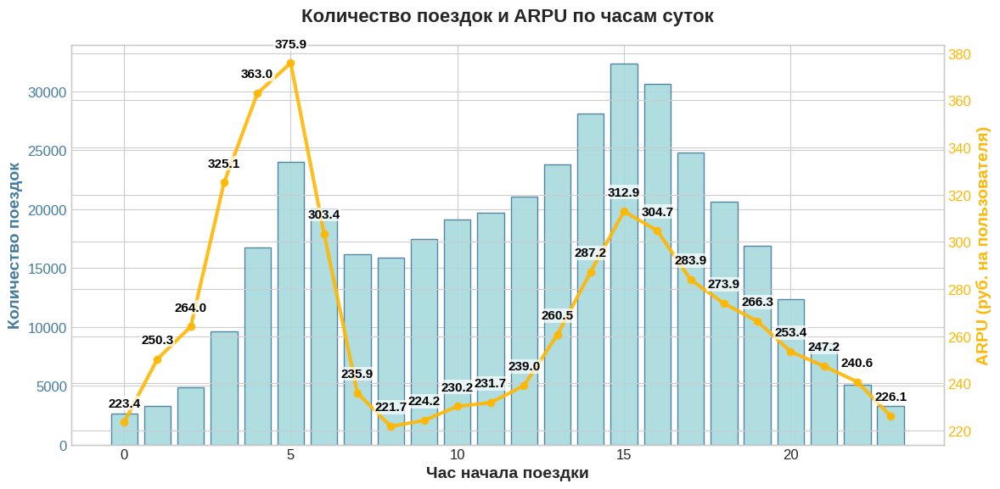

In [307]:
fig, ax1 = plt.subplots(figsize=(12,6))

hourly_stats = (
    df.groupby("start_hour")
    .agg(
        trips=("order_rk", "count"),
        users=("party_rk", "nunique"),
        total_profit=("profit", "sum")
    )
    .reset_index()
)
hourly_stats["arpu"] = hourly_stats["total_profit"] / hourly_stats["users"]

bars = ax1.bar(hourly_stats["start_hour"], hourly_stats["trips"],
               color="#a8dadc", edgecolor="#457b9d", alpha=0.9)

ax1.set_xlabel("Час начала поездки", fontsize=14, fontweight="bold")
ax1.set_ylabel("Количество поездок", color="#457b9d", fontsize=14, fontweight="bold")
ax1.tick_params(axis="y", labelcolor="#457b9d", labelsize=12)
ax1.tick_params(axis="x", labelsize=12)


ax2 = ax1.twinx()
ax2.plot(hourly_stats["start_hour"], hourly_stats["arpu"],
         color="#ffb703", marker="o", linewidth=3, alpha=0.9)

for x, y in zip(hourly_stats["start_hour"], hourly_stats["arpu"]):
    ax2.text(x, y + max(hourly_stats["arpu"])*0.015,
             f"{y:.1f}", ha="center", va="bottom",
             fontsize=11, color="black", fontweight="bold",
             bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=1))

ax2.set_ylabel("ARPU (руб. на пользователя)", color="#ffb703", fontsize=14, fontweight="bold")
ax2.tick_params(axis="y", labelcolor="#ffb703", labelsize=12)

plt.title("Количество поездок и ARPU по часам суток", fontsize=16, fontweight="bold", pad=20)
plt.tight_layout()

В дополнение к предыдущим выводам стоит выделить то, что несмотря на высокую потребность в послеобеденное время ARPU не поспевает за спросом.

Text(147.58333333333334, 0.5, 'Сегмент пользователя')

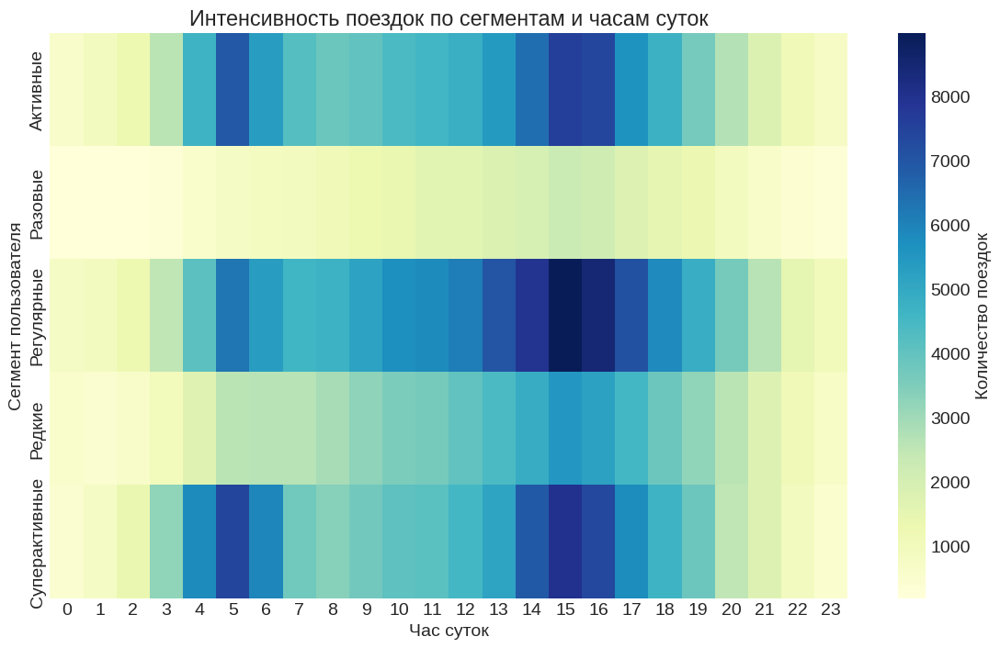

In [308]:
segment_hour = df.groupby(["user_segment", "start_hour"])["order_rk"].count().reset_index()
pivot_table = segment_hour.pivot(index="user_segment", columns="start_hour", values="order_rk")

plt.figure()
sns.heatmap(pivot_table, cmap="YlGnBu", annot=False, cbar_kws={'label': 'Количество поездок'})
plt.title("Интенсивность поездок по сегментам и часам суток")
plt.xlabel("Час суток")
plt.ylabel("Сегмент пользователя")

Подверждается наблюдение о двух пиках и в сегментах клиентов. Причем суперактивные ездят с утра чаще чем остальные группы, а разовые и редкие -- очень мало.

# Прочее

In [309]:
df['creation_to_start_delay_minutes'] = (df['book_start_dttm'] - df['created_dttm']).dt.total_seconds() / 60
print("Анализ экстремальных случаев задержки:")
print(f"95-й перцентиль: {df['creation_to_start_delay_minutes'].quantile(0.95):.2f} минут")
print(f"99-й перцентиль: {df['creation_to_start_delay_minutes'].quantile(0.99):.2f} минут")

quick_start = len(df[df['creation_to_start_delay_minutes'] <= 1]) / len(df) * 100
print(f"Поездки с задержкой менее 1 минуты: {quick_start:.2f}%")

Анализ экстремальных случаев задержки:
95-й перцентиль: 0.14 минут
99-й перцентиль: 0.52 минут
Поездки с задержкой менее 1 минуты: 99.32%


/tmp/ipython-input-1571298971.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipython-input-1571298971.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")


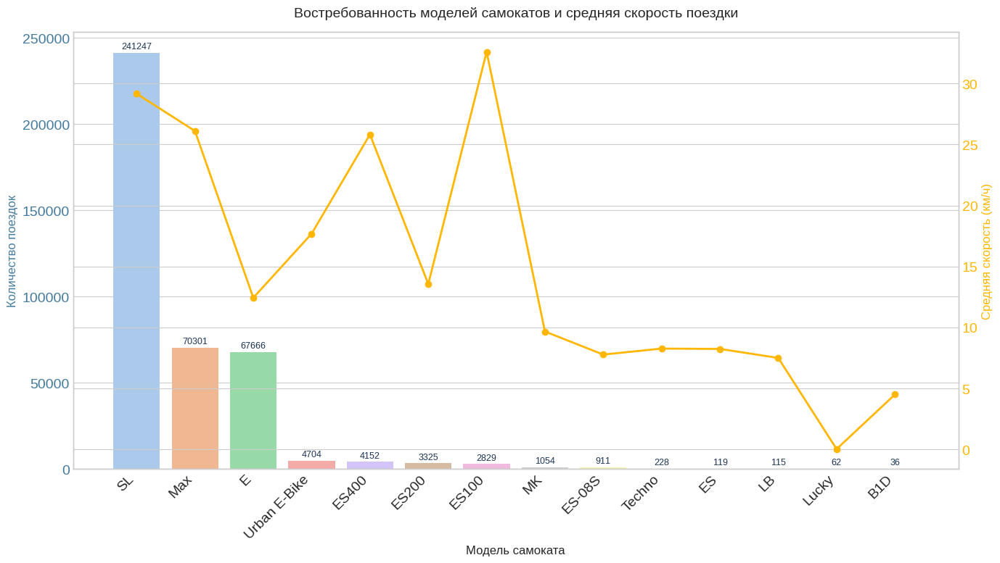

In [310]:
model_stats = (
    df.groupby("transport_model")
    .agg(
        trips=("order_rk", "count"),
        avg_speed=("speed_kmh", "mean")
    )
    .reset_index()
    .sort_values("trips", ascending=False)
)

fig, ax1 = plt.subplots()
sns.barplot(
    data=model_stats,
    x="transport_model",
    y="trips",
    palette="pastel",
    ax=ax1
)
ax1.set_ylabel("Количество поездок", color="#457b9d", fontsize=12)
ax1.set_xlabel("Модель самоката", fontsize=12)
ax1.tick_params(axis="y", labelcolor="#457b9d")
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")
for i, v in enumerate(model_stats["trips"]):
    ax1.text(i, v + max(model_stats["trips"])*0.01, str(v), ha="center", fontsize=9, color="#1d3557")

ax2 = ax1.twinx()
ax2.plot(model_stats["transport_model"], model_stats["avg_speed"],
         color="#ffb703", marker="o", linewidth=2)
ax2.set_ylabel("Средняя скорость (км/ч)", color="#ffb703", fontsize=12)
ax2.tick_params(axis="y", labelcolor="#ffb703")

plt.title("Востребованность моделей самокатов и средняя скорость поездки", fontsize=14, pad=15)
plt.tight_layout()

БОльшая часть всех поездок осуществляется на модели SL. Что примечательно, у менее популярных моделей меньшая скорость (возможно это тестовые или устаревшие модели)

/tmp/ipython-input-2125440377.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="user_segment", y="loyalty_accrual_rub_amt", estimator="mean", ax=axes[1,0], palette="Blues")
/tmp/ipython-input-2125440377.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="user_segment", y="loyalty_accrual_bns_amt", estimator="mean", ax=axes[1,1], palette="Oranges")


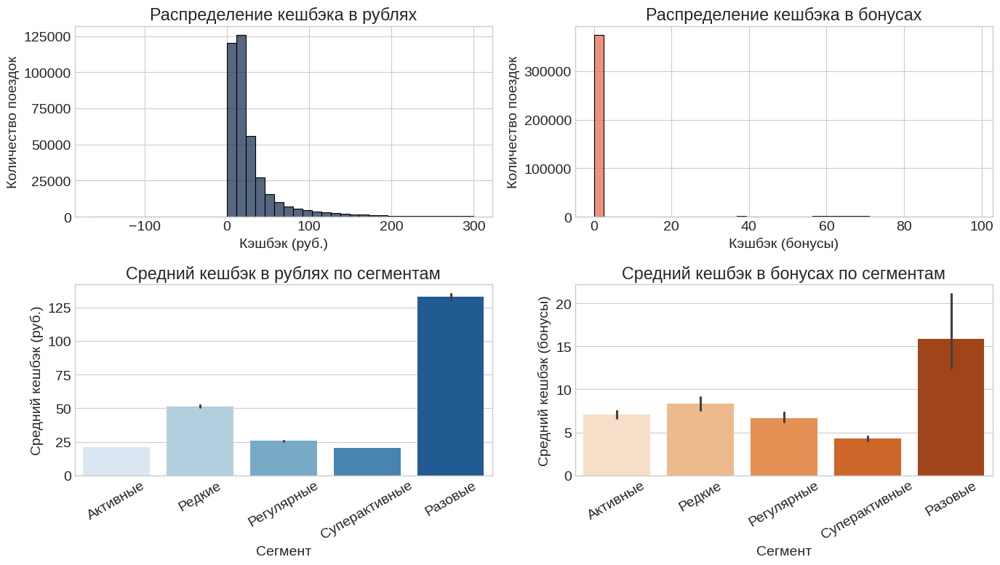

In [311]:
df_rub = df[df["loyalty_accrual_rub_amt"] <= df["loyalty_accrual_rub_amt"].quantile(0.99)]
df_bns = df[df["loyalty_accrual_bns_amt"] <= df["loyalty_accrual_bns_amt"].quantile(0.99)]

fig, axes = plt.subplots(2, 2)
sns.histplot(df_rub["loyalty_accrual_rub_amt"], bins=40, ax=axes[0,0], color="#1d3557")
axes[0,0].set_title("Распределение кешбэка в рублях")
axes[0,0].set_xlabel("Кэшбэк (руб.)")
axes[0,0].set_ylabel("Количество поездок")

sns.histplot(df_bns["loyalty_accrual_bns_amt"], bins=40, ax=axes[0,1], color="#e76f51")
axes[0,1].set_title("Распределение кешбэка в бонусах")
axes[0,1].set_xlabel("Кэшбэк (бонусы)")
axes[0,1].set_ylabel("Количество поездок")

sns.barplot(data=df, x="user_segment", y="loyalty_accrual_rub_amt", estimator="mean", ax=axes[1,0], palette="Blues")
axes[1,0].set_title("Средний кешбэк в рублях по сегментам")
axes[1,0].set_xlabel("Сегмент")
axes[1,0].set_ylabel("Средний кешбэк (руб.)")
axes[1,0].tick_params(axis="x", rotation=30)

sns.barplot(data=df, x="user_segment", y="loyalty_accrual_bns_amt", estimator="mean", ax=axes[1,1], palette="Oranges")
axes[1,1].set_title("Средний кешбэк в бонусах по сегментам")
axes[1,1].set_xlabel("Сегмент")
axes[1,1].set_ylabel("Средний кешбэк (бонусы)")
axes[1,1].tick_params(axis="x", rotation=30)

plt.tight_layout()

Исходя их гистограмм кешбеков -- бОльшая часть всех поездок оплачивается дебетовой картой. Гистрограмма кешбэка по сегментам указывает на то, что разовые поездки более длительные?

# Гипотезы

1. Если ввести специальные послеобеденные тарифы (12–16) с повышенной стоимостью старта, то ARPU в этот период вырастет на 10%, при этом количество поездок не снизится более чем на 5%.
2. Если предлагать скидку 50% на вторую поездку в течение 3 дней после первой, то доля клиентов, совершающих ≥2 поездки, увеличится на 20%.
3. Если предложить новым пользователям абонементы с бесплатным стартом на 5 дней в начале сезона (апрель), то доля клиентов, вернувшихся в течение 30 дней после первой поездки, вырастет на 3%.






### SMART
1.

Specific: введём специальные послеобеденные тарифы с увеличенной стоимостью старта.

Measurable: ARPU в этот период.

Achievable: рост ARPU на 10% при снижении количества поездок не более чем на 5%.

Relevant: в часы 12–16 наблюдается высокий спрос, но низкий ARPU.

Time-bound: проверка в течение 2 недель через A/B-тест.

2.

Specific: предложим пользователям скидку 50% на вторую поездку в течение 3 дней после первой.

Measurable: доля пользователей, совершивших ≥2 поездки.

Achievable: увеличение этой доли на 20%.

Relevant: сегмент «Разовые» -- основной источник потерь retention, хотим конвертировать их в «Редких/Регулярных».

Time-bound: проверка в течение 1 месяца.

3.

Specific: предоставим новым пользователям абонементы с бесплатным стартом на 5 дней в начале сезона (апрель).

Measurable: доля клиентов, вернувшихся в течение 30 дней после первой поездки.

Achievable: рост метрики на 3%.

Relevant: по когортному анализу пользователи весенних когорт удерживаются дольше всего.

Time-bound: проверка в течение весенних месяцев.

### ICE
1.

Impact: средний, т.к. затронет только послеобеденные поездки.

Confidence: средняя -- из-за возможного оттока клиентов.

Ease: высокая -- просто ввести новый тариф.



2.

Impact: очень высокий -- сегмент разовых пользователей огромен(22k), если хотя бы часть конвертировать последует кратный рост retention и LTV.

Confidence: средняя -- скидка может сработать, но не факт, что удержит в долгую.

Ease: средняя -- нужно настроить механику скидки и push-уведомление.


3.

Impact: средний -- охватывает новых пользователей весной.

Confidence: высокая -- подтверждается когортным анализом.

Ease: низкая -- нужно запускать маркетинг.